**INTRODUCTION**

This dataset consists of legal case data, where each record represents a unique legal case with associated details. The dataset includes the following key attributes:

 * case_id: A unique identifier for each legal case.

 * case_outcome: The legal outcome or classification of the case, such as "cited," "distinguished," or other legal terms representing how the case is categorized or referenced in the legal domain.

* case_title: The title of the legal case, often providing a brief description of the parties involved or the legal matter being addressed.

* case_text: A textual description of the case, detailing the facts, legal arguments, and judgments associated with the case. This serves as the primary input for the classification model.

This project aims to build a deep learning model for classifying legal cases based on their textual content. The dataset consists of legal case records, each containing a unique case identifier, title, text, and an outcome label such as "cited," "distinguished," or other legal classifications. By leveraging deep learning techniques, specifically Bidirectional LSTMs (Long Short-Term Memory networks), the model will process and analyze the case texts to predict the corresponding outcomes. This model will automate the classification of legal cases, enabling faster and more efficient legal research, case retrieval, and prediction of case outcomes, enhancing decision-making processes for legal professionals.

In [181]:
#importing necesaary libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import re
from tensorflow.keras.preprocessing.text import Tokenizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,recall_score,precision_score

In [182]:
import pandas as pd

In [183]:
df=pd.read_csv('legal_text_classification.csv')
df

,case_id,case_outcome,case_title,case_text
0,Case1,cited,Alpine Hardwood (Aust) Pty Ltd v Hardys Pty Lt...,Ordinarily that discretion will be exercised s...
1,Case2,cited,Black v Lipovac [1998] FCA 699 ; (1998) 217 AL...,The general principles governing the exercise ...
2,Case3,cited,Colgate Palmolive Co v Cussons Pty Ltd (1993) ...,Ordinarily that discretion will be exercised s...
3,Case4,cited,Dais Studio Pty Ltd v Bullett Creative Pty Ltd...,The general principles governing the exercise ...
4,Case5,cited,Dr Martens Australia Pty Ltd v Figgins Holding...,The preceding general principles inform the ex...
...,...,...,...,...
24980,Case25203,cited,Reches Pty Ltd v Tadiran Pty Ltd (1998) 85 FCR...,That is not confined to persons who control th...
24981,Case25204,cited,Sir Lindsay Parkinson &amp; Co Ltd v Triplan L...,Once the threshold prescribed by s 1335 is sat...
24982,Case25205,cited,Spiel v Commodity Brokers Australia Pty Ltd (I...,Once the threshold prescribed by s 1335 is sat...
24983,Case25206,distinguished,"Tullock Ltd v Walker (Unreported, Supreme Cour...",Given the extent to which Deumer stands to gai...


In [184]:
df.head()

,case_id,case_outcome,case_title,case_text
0,Case1,cited,Alpine Hardwood (Aust) Pty Ltd v Hardys Pty Lt...,Ordinarily that discretion will be exercised s...
1,Case2,cited,Black v Lipovac [1998] FCA 699 ; (1998) 217 AL...,The general principles governing the exercise ...
2,Case3,cited,Colgate Palmolive Co v Cussons Pty Ltd (1993) ...,Ordinarily that discretion will be exercised s...
3,Case4,cited,Dais Studio Pty Ltd v Bullett Creative Pty Ltd...,The general principles governing the exercise ...
4,Case5,cited,Dr Martens Australia Pty Ltd v Figgins Holding...,The preceding general principles inform the ex...


In [185]:
df.tail(10)

,case_id,case_outcome,case_title,case_text
24975,Case25198,cited,Newtons Travel Services Pty Ltd v Ansett Trans...,"In my view, it is clear that the Court may do ..."
24976,Case25199,cited,Pacific Acceptance Corp Ltd v Forsyth (No 2) [...,That is not confined to persons who control th...
24977,Case25200,cited,Pasdale Pty Ltd v Concrete Constructions (1995...,"In my view, it is clear that the Court may do ..."
24978,Case25201,cited,P S Chellaram &amp; Co Ltd v China Ocean Shipp...,"In my view, it is clear that the Court may do ..."
24979,Case25202,cited,Ratepayers &amp; Residents Action Association ...,Once the threshold prescribed by s 1335 is sat...
24980,Case25203,cited,Reches Pty Ltd v Tadiran Pty Ltd (1998) 85 FCR...,That is not confined to persons who control th...
24981,Case25204,cited,Sir Lindsay Parkinson &amp; Co Ltd v Triplan L...,Once the threshold prescribed by s 1335 is sat...
24982,Case25205,cited,Spiel v Commodity Brokers Australia Pty Ltd (I...,Once the threshold prescribed by s 1335 is sat...
24983,Case25206,distinguished,"Tullock Ltd v Walker (Unreported, Supreme Cour...",Given the extent to which Deumer stands to gai...
24984,Case25207,distinguished,Yandil Holdings Pty Ltd v Insurance Co of Nort...,"In my view, it is clear that the Court may do ..."


In [186]:
df.size

99940

In [187]:
df.shape

(24985, 4)

In [188]:
df.columns

Index(['case_id', 'case_outcome', 'case_title', 'case_text'], dtype='object')

In [189]:
df.isnull().sum()

case_id           0
case_outcome      0
case_title        0
case_text       176
dtype: int64

In [190]:
df.duplicated().sum()

0

In [191]:
df.drop(['case_id','case_title'],axis=1,inplace=True)
df

,case_outcome,case_text
0,cited,Ordinarily that discretion will be exercised s...
1,cited,The general principles governing the exercise ...
2,cited,Ordinarily that discretion will be exercised s...
3,cited,The general principles governing the exercise ...
4,cited,The preceding general principles inform the ex...
...,...,...
24980,cited,That is not confined to persons who control th...
24981,cited,Once the threshold prescribed by s 1335 is sat...
24982,cited,Once the threshold prescribed by s 1335 is sat...
24983,distinguished,Given the extent to which Deumer stands to gai...


In [192]:
df.dropna(inplace=True)

In [193]:
df.isnull().sum()

case_outcome    0
case_text       0
dtype: int64

In [194]:
for i in df.columns:
    print(df[i].value_counts(),i)
    print("*"*50)
    print(df[i].unique(),i)

case_outcome
cited            12110
referred to       4363
applied           2438
followed          2252
considered        1699
discussed         1018
distinguished      603
related            112
approved           108
affirmed           106
Name: count, dtype: int64 case_outcome
**************************************************
['cited' 'applied' 'followed' 'referred to' 'related' 'considered'
 'discussed' 'distinguished' 'affirmed' 'approved'] case_outcome
case_text
submitted that this Court should hold that there has been no imputed waiver because the Commonwealth has made no attempt to identify why it would be unfair or inequitable for AWB to maintain privilege in the underlying investigations. This submission immediately raises the question unfair or inequitable to whom? I doubt that any question arises of fairness to the Commission it is an arm of the executive government charged with the investigation of specified matters. Nor does any question arise of fairness to the Commonw

In [195]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()

l1=le.fit(df['case_outcome'])
df['case_outcome']=l1.transform(df['case_outcome'])

In [196]:
#splitting the dataset into feature and target

features=df['case_text']
target=df['case_outcome']

In [197]:
from tensorflow.keras.utils import to_categorical

targets=to_categorical(target)
print(targets)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [198]:
xtrain,xtest,ytrain,ytest=train_test_split(features,targets,test_size=0.15,random_state=4)   

In [199]:
xtrain

10182    The legal principles that govern the exercise ...
15317    caution must be exercised in attempting to rel...
1143     In my view, and contrary to the Secretary's su...
10724    statements set forth by the present First Appe...
6251     Spincode Pty Ltd v Look Software Pty Ltd [2001...
                               ...                        
11955    purpose of the anti-dumping measures, identifi...
22564    present purposes, the crucial one of those fiv...
17220    the courts do not easily reach this view as Di...
8431     general history of the town camps is set out i...
17663    was put by way of an alternative argument that...
Name: case_text, Length: 21087, dtype: object

In [200]:
ytrain

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [201]:
import re

def normalize(data):
    
    normalized = []
    for i in data:
        
        # Convert text to lowercase
        i = i.lower()  
        
        # Remove URLs
        i = re.sub(r'https?://\S+|www\.\S+', ' ', i)
        
        # Remove non-word characters and extra spaces
        
        i = re.sub(r'\W', ' ', i)  # removes any character that is not a word character (letters, digits, underscores).
        
        i = re.sub(r'\n', '', i)  # Remove newlines

        i = re.sub(r'[-,()]', ' ', i)  # Remove hyphens, commas, and parentheses
        
        i = re.sub(r' +', ' ', i)  # Replace multiple spaces with a single space
        
        i = re.sub(r'^\s+|\s+?$', '', i)  #Removes spaces from the beginning and end of the string.


        # Replace citations and numbers with a placeholder
        text = re.sub(r'\[.*?\]|\(.*?\)|\d+', '<CITATION>', i)

        # Split long sentences for better readability
        sentences = re.split(r'(?<=\.)\s+', i)

        # Join processed text back if necessary
        processed_text = ' '.join(sentences)
        
        normalized.append(i)
        
    return normalized

In [202]:
xtrain=normalize(xtrain)
xtest=normalize(xtest)

In [203]:
xtrain

['the legal principles that govern the exercise of the court s discretion under this rule have been discussed in a number of recent cases and are well established see bass v permanent trustee co ltd 1999 hca 9 1999 198 clr 334 bass at 355 359 tepko pty ltd v water board 2001 hca 19 2001 206 clr 1 tepko at 55 reading australia pty ltd v australian mutual provident society 1999 217 alr 495 reading at 497 500 7 11 direct factory outlets homebush pty ltd v property council of australia 2005 fca 1002 direct factory outlets at 2 4 souflett beheer v awb limited 2004 fca 518 souflett beheer at 19 20 kockums ab v commonwealth 2002 fcafc 138 at 38 41 smithkline beecham aust pty ltd v chipman 2002 fca 674 smithkline at 35 39 spi spirits cyprus ltd v diageo australia ltd 2006 fca 14 diageo at 22 27 save the ridge inc v commonwealth 2005 fcafc 203 2005 147 fcr 97 save the ridge at 103 104 15 17 rainsford v victoria 2005 fcafc 163 2005 144 fcr 279 rainsford at 291 294 36 44 director of fisheries nt 

In [204]:
xtest

['the minister submitted that following the decision in re minister for immigration and multicultural and indigenous affairs ex parte lam 2003 hca 6 2003 214 clr 1 the applicant must do more than simply identify an expectation that a particular treaty would be applied the applicant must identify some respect in which he suffered a practical injustice because of the procedure that was followed the minister submitted that even if the court were to find that the applicant was stateless the applicant could not have had a legitimate expectation that the minister would consider obligations arising under the cssp because the cssp was not one of the international instruments expressly referred to in direction 21 28 as the full court noted in minogue the authority relied on by counsel for the applicant the notion that departure from a course that a person has an expectation will be followed is an aspect of procedural fairness even making a range of assumptions in the applicant s favour about th

In [205]:
xtest = [re.sub(r'\[.*?\]|\(.*?\)|\d+', '<CITATION>', i) for i in xtest]

In [206]:
xtest

['the minister submitted that following the decision in re minister for immigration and multicultural and indigenous affairs ex parte lam <CITATION> hca <CITATION> <CITATION> <CITATION> clr <CITATION> the applicant must do more than simply identify an expectation that a particular treaty would be applied the applicant must identify some respect in which he suffered a practical injustice because of the procedure that was followed the minister submitted that even if the court were to find that the applicant was stateless the applicant could not have had a legitimate expectation that the minister would consider obligations arising under the cssp because the cssp was not one of the international instruments expressly referred to in direction <CITATION> <CITATION> as the full court noted in minogue the authority relied on by counsel for the applicant the notion that departure from a course that a person has an expectation will be followed is an aspect of procedural fairness even making a ra

In [207]:
max_vocab=20000
tokenizer=Tokenizer(num_words=max_vocab)
tokenizer.fit_on_texts(xtrain)

In [208]:
#tokenize text into vectors

xtrain=tokenizer.texts_to_sequences(xtrain)
xtest=tokenizer.texts_to_sequences(xtest)

In [209]:
from tensorflow.keras.preprocessing.sequence import pad_sequences

xtrain=tf.keras.preprocessing.sequence.pad_sequences(xtrain,padding='post',maxlen=256)
xtest=tf.keras.preprocessing.sequence.pad_sequences(xtest,padding='post',maxlen=256)

In [210]:
xtrain

array([[ 1848,   415,   186, ..., 14085,     9,   321],
       [  702,    14,   167, ...,     2,     1,   702],
       [   60,  2753,     8, ...,   162,   193,  1315],
       ...,
       [  994,   286,  2795, ...,     4,     1,  1660],
       [  168,  1241,     2, ...,     0,     0,     0],
       [   18,   366,    16, ...,     0,     0,     0]])

In [288]:
xtest

array([[ 118,  189,  141, ...,    4,  109,   91],
       [   4, 2887,   15, ...,    0,    0,    0],
       [6074,  469, 6074, ...,    0,    0,    0],
       ...,
       [ 213,   64,  175, ...,    0,    0,    0],
       [ 138,   70,  289, ...,    3,   10,   52],
       [ 233, 2158,   38, ...,    0,    0,    0]])

In [292]:
model=tf.keras.Sequential([
    tf.keras.layers.Embedding(max_vocab,128),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64,return_sequences=True)),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(16)),
    tf.keras.layers.Dense(64,activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(10,activation='softmax')
])
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ embedding_2 (Embedding)              │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_4 (Bidirectional)      │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_5 (Bidirectional)      │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ ?                           │     0 (unbuilt) │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

In [294]:
max_sequence_length=100

In [296]:
model.build(input_shape=(None, max_sequence_length))
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ embedding_2 (Embedding)              │ (None, 100, 128)            │       2,560,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_4 (Bidirectional)      │ (None, 100, 128)            │          98,816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_5 (Bidirectional)      │ (None, 32)                  │          18,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 10)                  │             650 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,680,138 (10.22 MB)

 Trainable params: 2,680,138 (10.22 MB)

 Non-trainable params: 0 (0.00 B)

In [298]:
model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),optimizer=tf.keras.optimizers.Adam(learning_rate=5e-4),metrics=['accuracy'])

In [300]:
history=model.fit(xtrain,ytrain,epochs=20,validation_split=0.1,batch_size=32,shuffle=True)

Epoch 1/20
594/594 ━━━━━━━━━━━━━━━━━━━━ 224s 352ms/step - accuracy: 0.4765 - loss: 1.7380 - val_accuracy: 0.4647 - val_loss: 1.5939
Epoch 2/20
594/594 ━━━━━━━━━━━━━━━━━━━━ 198s 333ms/step - accuracy: 0.4905 - loss: 1.5597 - val_accuracy: 0.4628 - val_loss: 1.5651
Epoch 3/20
594/594 ━━━━━━━━━━━━━━━━━━━━ 204s 344ms/step - accuracy: 0.5090 - loss: 1.4018 - val_accuracy: 0.4405 - val_loss: 1.6199
Epoch 4/20
594/594 ━━━━━━━━━━━━━━━━━━━━ 198s 333ms/step - accuracy: 0.5796 - loss: 1.2257 - val_accuracy: 0.4614 - val_loss: 1.6494
Epoch 5/20
594/594 ━━━━━━━━━━━━━━━━━━━━ 204s 344ms/step - accuracy: 0.6383 - loss: 1.0704 - val_accuracy: 0.4599 - val_loss: 1.6879
Epoch 6/20
594/594 ━━━━━━━━━━━━━━━━━━━━ 205s 345ms/step - accuracy: 0.6834 - loss: 0.9306 - val_accuracy: 0.4704 - val_loss: 1.8641
Epoch 7/20
594/594 ━━━━━━━━━━━━━━━━━━━━ 205s 346ms/step - accuracy: 0.7190 - loss: 0.8432 - val_accuracy: 0.4689 - val_loss: 1.8786
Epoch 8/20
594/594 ━━━━━━━━━━━━━━━━━━━━ 393s 661ms/step - accuracy: 0.7573 -

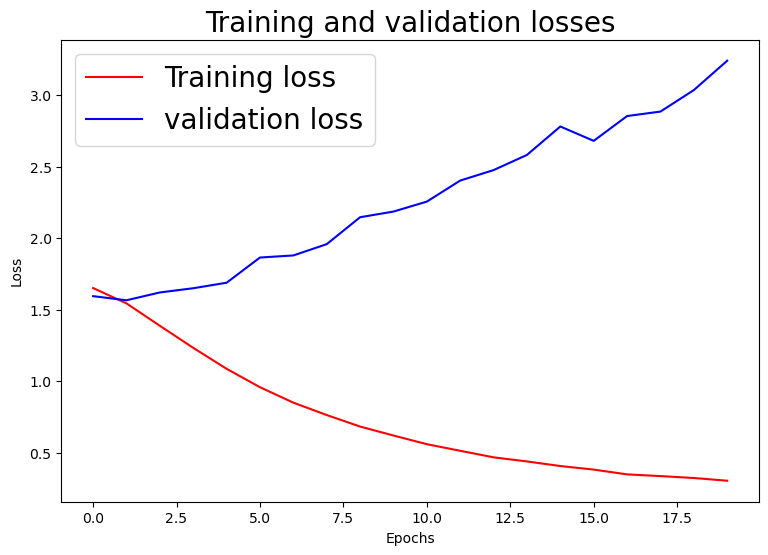

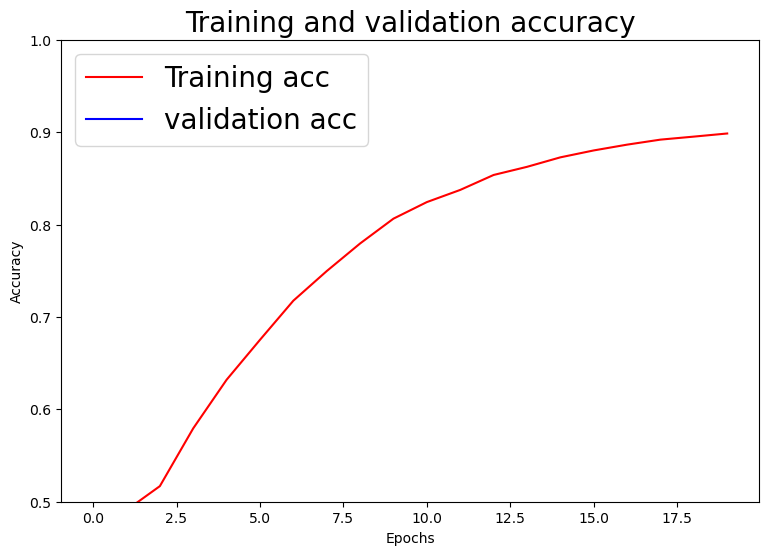

In [307]:
hd=history.history

acc=hd['accuracy']
val_acc=hd['val_accuracy']
loss=hd['loss']
val_loss=hd['val_loss']
epochs=history.epoch

import matplotlib.pyplot as plt

plt.figure(figsize=(9,6))
plt.plot(epochs,loss,'r',label='Training loss')
plt.plot(epochs,val_loss,'b',label='validation loss')
plt.title('Training and validation losses',size=20)
plt.xlabel('Epochs',size=10)
plt.ylabel('Loss',size=10)
plt.legend(prop={'size':20})
plt.show()

plt.figure(figsize=(9,6))
plt.plot(epochs,acc,'r',label='Training acc')
plt.plot(epochs,val_acc,'b',label='validation acc')
plt.title('Training and validation accuracy',size=20)
plt.xlabel('Epochs',size=10)
plt.ylabel('Accuracy',size=10)
plt.legend(prop={'size':20})
plt.ylim((0.5,1))
plt.show()

In [308]:
model.evaluate(xtest,ytest)

117/117 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - accuracy: 0.4958 - loss: 2.8178


[2.961695432662964, 0.48092424869537354]

In [310]:
import numpy as np

pred = model.predict(xtest)
multiclass_pred = []

for i in pred:
    multiclass_pred.append(np.argmax(i))  # Select the index of the highest probability for each prediction

117/117 ━━━━━━━━━━━━━━━━━━━━ 13s 104ms/step


In [311]:
multiclass_pred

[1,
 4,
 3,
 3,
 8,
 6,
 6,
 3,
 1,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 6,
 4,
 3,
 8,
 3,
 6,
 8,
 7,
 3,
 3,
 3,
 8,
 3,
 3,
 5,
 3,
 3,
 3,
 4,
 3,
 3,
 3,
 3,
 1,
 3,
 3,
 3,
 3,
 8,
 3,
 3,
 6,
 1,
 8,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 8,
 5,
 3,
 8,
 4,
 3,
 3,
 3,
 3,
 3,
 3,
 8,
 8,
 8,
 3,
 1,
 1,
 3,
 3,
 3,
 8,
 3,
 3,
 6,
 8,
 3,
 3,
 3,
 7,
 1,
 1,
 3,
 4,
 6,
 3,
 3,
 3,
 3,
 1,
 3,
 3,
 8,
 1,
 3,
 3,
 3,
 3,
 3,
 5,
 3,
 7,
 3,
 3,
 8,
 3,
 3,
 7,
 7,
 3,
 7,
 3,
 3,
 8,
 3,
 3,
 3,
 3,
 1,
 1,
 3,
 3,
 3,
 3,
 3,
 4,
 4,
 3,
 3,
 3,
 3,
 1,
 1,
 1,
 3,
 3,
 3,
 8,
 3,
 4,
 5,
 3,
 3,
 7,
 5,
 3,
 1,
 3,
 3,
 4,
 3,
 3,
 1,
 6,
 8,
 3,
 4,
 3,
 3,
 3,
 3,
 1,
 5,
 1,
 1,
 1,
 7,
 8,
 3,
 3,
 3,
 6,
 6,
 3,
 3,
 3,
 3,
 3,
 6,
 1,
 3,
 8,
 3,
 6,
 3,
 6,
 1,
 4,
 8,
 4,
 3,
 8,
 3,
 3,
 3,
 1,
 8,
 3,
 7,
 8,
 3,
 1,
 3,
 5,
 3,
 3,
 4,
 3,
 1,
 7,
 1,
 5,
 3,
 3,
 7,
 8,
 3,
 3,
 3,
 3,
 8,
 3,
 3,
 3,
 3,
 1,
 3,
 3,
 6,
 3,
 8,
 3,
 1,
 3,
 8,
 3,
 3,
 3,
 3,
 3,
 3,
 5,
 6,


In [312]:
ytest_single_label=np.argmax(ytest,axis=1)

In [313]:
from sklearn.metrics import accuracy_score, precision_score, recall_score

print('Accuracy on testing set:', accuracy_score(ytest_single_label, multiclass_pred))
print('Precision on testing set:', precision_score(ytest_single_label,multiclass_pred, average='macro'))
print('Recall on testing set:', recall_score(ytest_single_label,multiclass_pred, average='macro'))

Accuracy on testing set: 0.48092423428264375
Precision on testing set: 0.2095772564230375
Recall on testing set: 0.20369212061785807


C:\Users\Manalsaheer\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [314]:
predict=['the minister submitted that following the decision in re minister for immigration and multicultural and indigenous affairs ex parte lam 2003 hca 6 2003 214 clr 1 the applicant must do more than simply identify an expectation that a particular treaty would be applied the applicant must identify some respect in which he suffered a practical injustice because of the procedure that was followed the minister submitted that even if the court were to find that the applicant was stateless the applicant could not have had a legitimate expectation that the minister would consider obligations arising under the cssp because the cssp was not one of the international instruments expressly referred to in direction 21 28 as the full court noted in minogue the authority relied on by counsel for the applicant the notion that departure from a course that a person has an expectation will be followed is an aspect of procedural fairness even making a range of assumptions in the applicant s favour about the contents of the two international instruments and that an expectation of the type asserted had been raised in a general sense the applicant singularly failed to provide the minister with any information which might reasonably have caused the minister not to decide to cancel the applicant s visa because of the instruments in substance the factual case now called in aid to establish that there would have been an expectation that the minister would act in a particular way was a case never raised with the minister before he made the impugned decision there was no unfairness see lam at 24 25 at best it would be a case based on facts now known and advanced by the applicant in these proceedings']

In [315]:
predict=normalize(predict)

In [316]:
predict=tokenizer.texts_to_sequences(predict)

In [317]:
predicts=tf.keras.preprocessing.sequence.pad_sequences(predict,padding='post',maxlen=256)

In [318]:
print(predicts)

[[  118   189   141   565   931    20  1869     5     7   134  3655    42
     10   289     1    45    86   931   135   132     4    22    56  1151
      7   944  1468   128     2     1  1170     5    18   956     1    71
    281     5   233    51     1    23    48     3   704     5     1    45
     18     1    45   145    12    29    40     7  1696  1869     5     1
     71    42   221   773   539    58     1   128     1    18    12    87
      2     1   441  4010   925   164     3     4  1253   324   403    19
      1   163    23   391     4 15702     1   246   356    21    16   205
     11     1    45     1  1840     5  2299    38     7   222     5     7
    117    32    20  1869    68    10   956     8    20  1449     2   598
    537   233   219     7  1088     2  3830     4     1    45    17   811
    223     1  1693     2     1   213   441  4010     6     5    20  1869
      2     1  2055  1125    40    37   421     4     7   168   456     1
     45 14821   519     3   417     1 

In [319]:
pred=model.predict(predicts)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


In [320]:
pred

array([[1.8009276e-05, 3.0036259e-01, 2.0497767e-03, 1.7886628e-01,
        1.0210696e-01, 7.5596939e-03, 1.5773774e-04, 3.6665669e-01,
        4.2130899e-02, 9.1305796e-05]], dtype=float32)

In [321]:
multi_class_predictions = np.argmax(pred, axis=1)

In [322]:
multi_class_predictions

array([7], dtype=int64)

------------------------
**CONCLUSION**

The development and implementation of the RNN model for legal text classification have yielded promising results, showcasing the potential of deep learning techniques in the legal field. By effectively capturing the context and sequential nature of legal language, the model demonstrates its utility in automating document classification tasks. This project highlights the value of leveraging AI to tackle intricate problems and lays the foundation for future advancements in legal technology, empowering legal professionals with faster and more reliable tools.